# Ectrated train and test from 10klinks data

In [0]:
start = '<TYPE>10-K'
end = '</DOCUMENT>'
result=[]

In [0]:
stock['link_text'] = ""

In [0]:
def find_between(s,start,end):
    return (s.split(start))[1].split(end)[0]

In [0]:
%%time
for rownum, row in stock.iterrows():
  try:
    html = row['10k_link_urls']
    link = url.urlopen(html).read()
    link_data = link.decode('utf-8')
    result = find_between(link_data,start,end)
    soup = bs(result,'lxml')
    text =soup.find_all(text=True)
    blacklist = ['a','sequence','filename','description']
    output =""

    for t in text:
      if t.parent.name not in blacklist:
        output += '{}'.format(t)
      # print(output)
      

  except:
      pass
  stock['link_text'][rownum]=output

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


CPU times: user 53min 35s, sys: 1min 43s, total: 55min 19s
Wall time: 1h 28min 24s
CPU times: user 53min 35s, sys: 1min 43s, total: 55min 19s
Wall time: 1h 28min 24s


###  Importing require Libraries

In [0]:
# Importing the packages 

# Load in our libraries
import pandas as pd
import numpy as np
import re
import sklearn
import xgboost as xgb
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

from nltk.tokenize import RegexpTokenizer
from nltk.tokenize import sent_tokenize
from nltk.tokenize import*
import nltk 

import plotly.offline as py
import plotly.tools as tls

import warnings
warnings.filterwarnings('ignore')

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.


In [0]:
from google.colab import drive
drive.mount('/content/drive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3Aietf%3Awg%3Aoauth%3A2.0%3Aoob&scope=email%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdocs.test%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive.photos.readonly%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fpeopleapi.readonly&response_type=code

Enter your authorization code:
··········
Mounted at /content/drive


### reading the data

In [0]:
stock =pd.read_csv("/content/drive/My Drive/mani.csv") 

### checking the Head,tail and shape

In [0]:
stock.shape

(2568, 6)

In [0]:
stock.head()

,ticker,cik,filing_date,10k_link_urls,long_term_outlook,link_text
0,FE,1031296,28-02-2012,https://www.sec.gov/Archives/edgar/data/103129...,0,"\nhtml PUBLIC ""-//W3C//DTD HTML 4.01 Transitio..."
1,CL,21665,19-02-2015,https://www.sec.gov/Archives/edgar/data/21665/...,0,"\nhtml PUBLIC ""-//W3C//DTD HTML 4.01 Transitio..."
2,PRU,1137774,19-02-2016,https://www.sec.gov/Archives/edgar/data/113777...,1,"\nhtml PUBLIC ""-//W3C//DTD HTML 4.01 Transitio..."
3,EBAY,1065088,28-03-2001,https://www.sec.gov/Archives/edgar/data/106508...,1,\n 1\n\n- ----------------------------------...
4,CAM,941548,25-02-2005,https://www.sec.gov/Archives/edgar/data/941548...,1,\ne10vk\n PAGEBREAK \n\n\n \n \nSECURITIES AND...


In [0]:
stock.tail()

,ticker,cik,filing_date,10k_link_urls,long_term_outlook,link_text
2563,PEP,77476,11-02-2016,https://www.sec.gov/Archives/edgar/data/77476/...,1,"\nhtml PUBLIC ""-//W3C//DTD HTML 4.01 Transitio..."
2564,PEP,77476,04-03-2004,https://www.sec.gov/Archives/edgar/data/77476/...,1,\nForm 10-K\n\nNo. 1-1183 SECURITIES AND EXCH...
2565,LO,1424847,12-02-2015,https://www.sec.gov/Archives/edgar/data/142484...,1,\n10-K\n\n \n UNITED STATES \nSECURITIES AND ...
2566,JWN,72333,18-03-2011,https://www.sec.gov/Archives/edgar/data/72333/...,1,\nForm 10-K\n\n \n UNITED STATES \nSECURITIES...
2567,APA,6769,29-02-2008,https://www.sec.gov/Archives/edgar/data/6769/0...,0,\ne10vk\n PAGEBREAK \n \n BEGIN PAGE WIDTH \n ...


In [0]:
stock.shape 

(2568, 6)

## Visualisation

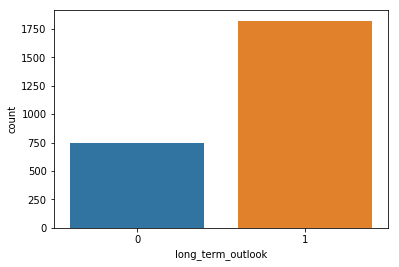

AttributeError: ignored

In [0]:
# Plot Distribution
sns.countplot(x='long_term_outlook',data=stock)
plt.show()

# What are the counts?
print(data.long_term_outlook.value_counts())

# What is the percentage?
count_increase = len(data[data.long_term_outlook == 1])
count_decrease = len(data[data.long_term_outlook == 0])

perc = (count_increase/(count_increase + count_decrease))*100

print('Percentage of companies whose stock prices have grown:', perc, "%")

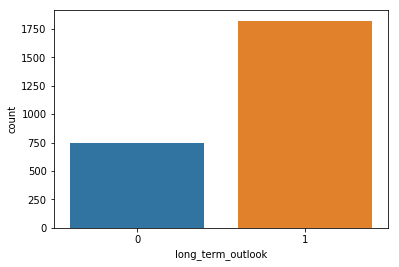

1    1821
0     747
Name: long_term_outlook, dtype: int64
Percentage of companies whose stock prices have grown: 70.91121495327103 %


In [0]:
# Plot Distribution
sns.countplot(x='long_term_outlook',data=stock)
plt.show()

# What are the counts?
print(data.long_term_outlook.value_counts())

# What is the percentage?
count_increase = len(data[data.long_term_outlook == 1])
count_decrease = len(data[data.long_term_outlook == 0])

perc = (count_increase/(count_increase + count_decrease))*100

print('Percentage of companies whose stock prices have grown:', perc, "%")

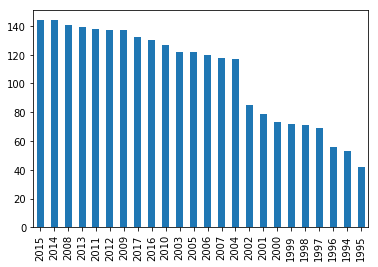

In [0]:
train_data['Date'].value_counts().plot(kind='bar')

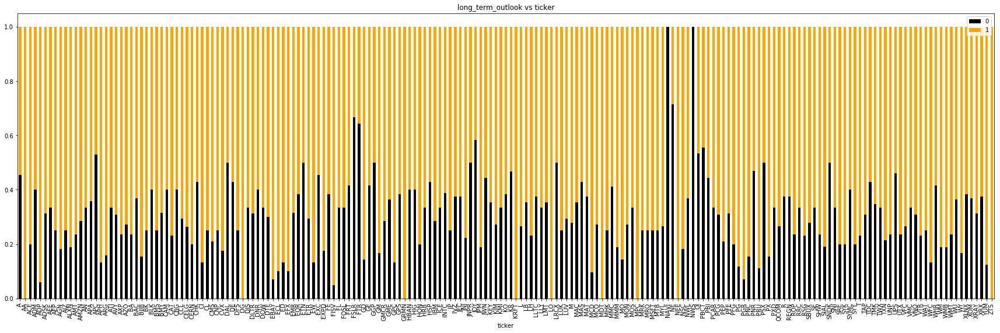

In [0]:
plt.rcParams['figure.figsize'] = (30, 9)
x = pd.crosstab(stock['ticker'], stock['long_term_outlook'])
x.div(x.sum(1).astype(float), axis = 0).plot(kind = 'bar', stacked = True,color=['black','orange'])
plt.title('long_term_outlook vs ticker')
plt.legend(loc="upper right")
plt.show()

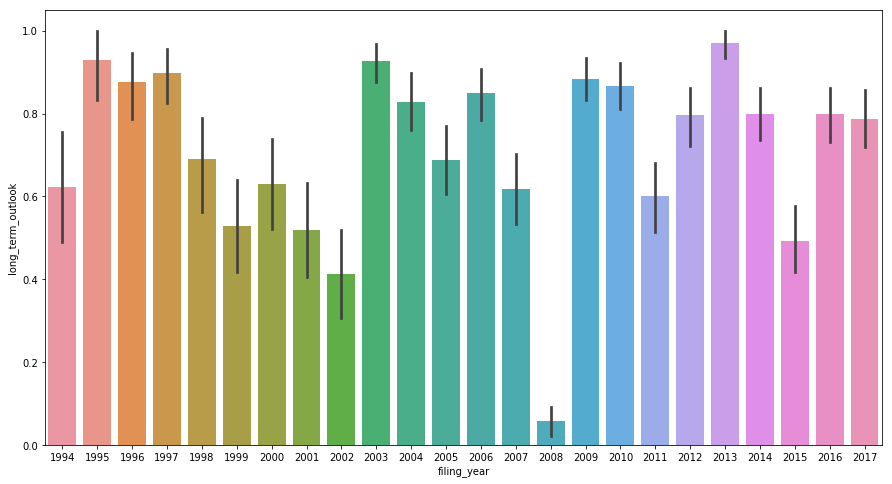

In [0]:
plt.figure(figsize=(15,8))
sns.barplot(x='filing_date',y='long_term_outlook',data=data)



1.   Since 1995, the stocks have a decreasing trend till 2002, probably due to the burst of the dot com bubble.
2.   An abnormality can be noticed in 2008 indicating the crash of the stock market during the recession period.


# Preprocessing on train data

### checking first link data and last link data

In [0]:
stock['link_text'][0]

'\nhtml PUBLIC "-//W3C//DTD HTML 4.01 Transitional//EN" "http://www.w3.org/TR/html4/loose.dtd"\n Document created using WebFilings 1 \n Copyright 2008-2012 WebFilings LLC. All Rights Reserved \nFE-12.31.2011-10K\n\xa0UNITED STATES SECURITIES AND EXCHANGE COMMISSIONWASHINGTON, D. C. 20549 FORM 10-K(Mark One)þ\xa0ANNUAL REPORT PURSUANT TO SECTION 13 OR 15(d) OF THE SECURITIES EXCHANGE ACT OF 1934For the fiscal year ended December\xa031, 2011ORo\xa0TRANSITION REPORT PURSUANT TO SECTION 13 OR 15(d) OF THE SECURITIES EXCHANGE ACT OF 1934For the transition period from \xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0 to  \xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0 CommissionFile Number\xa0Registrant; State of Incorporation;Address; and Telephone Number\xa0I.R.S. EmployerIdentification No.\xa0\xa0\xa0\xa0\xa0333-21011\xa0FIRSTENERGY CORP.\xa034-1843785\xa0\xa0(An Ohio Corporation)\xa0\xa0\xa0\xa076 South Main Street\xa0\xa0\x

In [0]:
stock['link_text'][2567] 

'\ne10vk\n PAGEBREAK \n\xa0\n BEGIN PAGE WIDTH \n END PAGE WIDTH \n BEGIN PAGE WIDTH \n callerid=999 iwidth=540 length=0 \n callerid=999 iwidth=540 length=0 \n\xa0\n\nUNITED STATES SECURITIES AND\n    EXCHANGE COMMISSION\n\n\nWashington,\xa0D.C.\n    20549\n\n\xa0\n\nForm\xa010-K\n\n\xa0\n\n Table Width Row BEGIN \n\n\xa0  colindex=01 type=maindata \n\xa0  colindex=02 type=gutter \n\xa0  colindex=02 type=maindata \n\n Table Width Row END \n\n\n(Mark One)\n    \n\n\n\xa0\n\n\n\xa0\n\n\n\n\n\nþ\n\n\n\n\xa0\n\n\nANNUAL REPORT PURSUANT TO SECTION 13 OR 15(d)\n\n\n\n\n\xa0\n\n\n\xa0\n\n\nOF THE SECURITIES EXCHANGE ACT OF 1934\n\n\n\n\n\xa0\n\n\n\xa0\n\n\nFor the fiscal year ended\n    December 31, 2007,\n\n\n\n\n\nOR\n\n\n\n\n\n\no\n\n\n\n\xa0\n\n\nTRANSITION REPORT PURSUANT TO SECTION 13 OR 15(d)  OF THE\n    SECURITIES EXCHANGE ACT OF 1934\n\n\n\n\n\xa0\n\n\n\xa0\n\n\nFor the Transition Period\n    from\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0to\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\n\n\

In [0]:
stock['link_text'] = [text.strip().lower() for text in stock['link_text']]
stock['link_text'][4] 

"e10vk\n pagebreak \n\n\n\xa0\n\xa0\nsecurities and exchange commission\nwashington, d.c. 20549\n\n\nform\xa010-k\n\n\n\n\n\n\n\nþ\xa0\nannual report pursuant to section 13 or 15(d) of the securities exchange act of 1934\n\n\nfor the fiscal year ended december\xa031, 2004\nor\n\n\n\n\n\n\n\n£\xa0\ntransition report pursuant to section 13 or 15(d) of the securities exchange act of 1934\n\n\n\ncommission file number 1-13884\ncooper cameron corporation\n(exact name of registrant as specified in its charter)\n\n\n begin table head \n\n\xa0\n\xa0\n\xa0\n\n end table head \n begin table body \n\ndelaware\n\n\xa0\n76-0451843\n\n\n(state or other jurisdiction of incorporation or organization)\n\n\xa0\n(i.r.s. employer identification no.)\n\n\n\xa0\n\xa0\n\xa0\n\n\n1333 west loop south\n\xa0\n\xa0\n\n\nsuite\xa01700\n\xa0\n\xa0\n\n\nhouston, texas\n\n\xa0\n77027\n\n\n(address of principal executive offices)\n\n\xa0\n(zip code)\n\n end table body \n\n\nregistrant\x92s telephone number, including

### Expanding contractions

In [0]:
contractions = {
"ain't": "is not",
"aren't": "are not",
"can't": "cannot",
"can't've": "cannot have",
"'cause": "because",
"could've": "could have",
"couldn't": "could not",
"couldn't've": "could not have",
"didn't": "did not",
"doesn't": "does not",
"don't": "do not",
"hadn't": "had not",
"hadn't've": "had not have",
"hasn't": "has not",
"haven't": "have not",
"he'd": "he would",
"he'd've": "he would have",
"he'll": "he will",
"he'll've": "he he will have",
"he's": "he is",
"how'd": "how did",
"how'd'y": "how do you",
"how'll": "how will",
"how's": "how is",
"I'd": "I would",
"I'd've": "I would have",
"I'll": "I will",
"I'll've": "I will have",
"I'm": "I am",
"I've": "I have",
"i'd": "i would",
"i'd've": "i would have",
"i'll": "i will",
"i'll've": "i will have",
"i'm": "i am",
"i've": "i have",
"isn't": "is not",
"it'd": "it would",
"it'd've": "it would have",
"it'll": "it will",
"it'll've": "it will have",
"it's": "it is",
"let's": "let us",
"ma'am": "madam",
"mayn't": "may not",
"might've": "might have",
"mightn't": "might not",
"mightn't've": "might not have",
"must've": "must have",
"mustn't": "must not",
"mustn't've": "must not have",
"needn't": "need not",
"needn't've": "need not have",
"o'clock": "of the clock",
"oughtn't": "ought not",
"oughtn't've": "ought not have",
"shan't": "shall not",
"sha'n't": "shall not",
"shan't've": "shall not have",
"she'd": "she would",
"she'd've": "she would have",
"she'll": "she will",
"she'll've": "she will have",
"she's": "she is",
"should've": "should have",
"shouldn't": "should not",
"shouldn't've": "should not have",
"so've": "so have",
"so's": "so as",
"that'd": "that would",
"that'd've": "that would have",
"that's": "that is",
"there'd": "there would",
"there'd've": "there would have",
"there's": "there is",
"they'd": "they would",
"they'd've": "they would have",
"they'll": "they will",
"they'll've": "they will have",
"they're": "they are",
"they've": "they have",
"to've": "to have",
"wasn't": "was not",
"we'd": "we would",
"we'd've": "we would have",
"we'll": "we will",
"we'll've": "we will have",
"we're": "we are",
"we've": "we have",
"weren't": "were not",
"what'll": "what will",
"what'll've": "what will have",
"what're": "what are",
"what's": "what is",
"what've": "what have",
"when's": "when is",
"when've": "when have",
"where'd": "where did",
"where's": "where is",
"where've": "where have",
"who'll": "who will",
"who'll've": "who will have",
"who's": "who is",
"who've": "who have",
"why's": "why is",
"why've": "why have",
"will've": "will have",
"won't": "will not",
"won't've": "will not have",
"would've": "would have",
"wouldn't": "would not",
"wouldn't've": "would not have",
"y'all": "you all",
"y'all'd": "you all would",
"y'all'd've": "you all would have",
"y'all're": "you all are",
"y'all've": "you all have",
"you'd": "you would",
"you'd've": "you would have",
"you'll": "you will",
"you'll've": "you will have",
"you're": "you are",
"you've": "you have"
}

In [0]:
def expand_contractions(text):
    for word in text.split():
        if word.lower() in contractions:
            text = text.replace(word, contractions[word.lower()])
    return text

### Invoking the expand_contractions functions

In [0]:
import unicodedata
def remove_accented_chars(text):
    text = unicodedata.normalize('NFKD', text).encode('ascii', 'ignore').decode('utf-8', 'ignore')
    return text

In [0]:
stock['link_text'] = [text.replace('"', '') for text in stock['link_text']]
stock['link_text'][0]

"html public -//w3c//dtd html 4.01 transitional//en http://www.w3.org/tr/html4/loose.dtd\n document created using webfilings 1 \n copyright 2008-2012 webfilings llc. all rights reserved \nfe-12.31.2011-10k\n\xa0united states securities and exchange commissionwashington, d. c. 20549 form 10-k(mark one)þ\xa0annual report pursuant to section 13 or 15(d) of the securities exchange act of 1934for the fiscal year ended december\xa031, 2011oro\xa0transition report pursuant to section 13 or 15(d) of the securities exchange act of 1934for the transition period from \xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0 to  \xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0 commissionfile number\xa0registrant; state of incorporation;address; and telephone number\xa0i.r.s. employeridentification no.\xa0\xa0\xa0\xa0\xa0333-21011\xa0firstenergy corp.\xa034-1843785\xa0\xa0(an ohio corporation)\xa0\xa0\xa0\xa076 south main street\xa0\xa0\xa0\xa0

### Removing url's from the text

In [0]:
url_reg  = r'[a-z]*[:.]+\S+'
stock['link_text'] = [re.sub(url_reg, '', text) for text in stock['link_text']]
stock['link_text'][0]

"html public -//w3c//dtd html 4 transitional//en \n document created using webfilings 1 \n copyright 2008-2012 webfilings llc. all rights reserved \nfe-12\n\xa0united states securities and exchange commissionwashington, d. c. 20549 form 10-k(mark one)þ\xa0annual report pursuant to section 13 or 15(d) of the securities exchange act of 1934for the fiscal year ended december\xa031, 2011oro\xa0transition report pursuant to section 13 or 15(d) of the securities exchange act of 1934for the transition period from \xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0 to  \xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0 commissionfile number\xa0registrant; state of incorporation;address; and telephone number\xa0 employeridentification no.\xa0\xa0\xa0\xa0\xa0333-21011\xa0firstenergy corp.\xa034-1843785\xa0\xa0(an ohio corporation)\xa0\xa0\xa0\xa076 south main street\xa0\xa0\xa0\xa0akron, oh 44308\xa0\xa0\xa0\xa0telephone (800)736-3402\xa

### Invoking the remove_accented_chars functions

In [0]:
stock['link_text'] = [remove_accented_chars(text) for text in stock['link_text']]
stock['link_text'][0]

"html public -//w3c//dtd html 4 transitional//en \n document created using webfilings 1 \n copyright 2008-2012 webfilings llc. all rights reserved \nfe-12\n united states securities and exchange commissionwashington, d. c. 20549 form 10-k(mark one) annual report pursuant to section 13 or 15(d) of the securities exchange act of 1934for the fiscal year ended december 31, 2011oro transition report pursuant to section 13 or 15(d) of the securities exchange act of 1934for the transition period from                      to                       commissionfile number registrant; state of incorporation;address; and telephone number  employeridentification no.     333-21011 firstenergy corp. 34-1843785  (an ohio corporation)    76 south main street    akron, oh 44308    telephone (800)736-3402       000-53742 firstenergy solutions corp. 31-1560186  (an ohio corporation)    c/o firstenergy corp.    76 south main street    akron, oh 44308    telephone (800)736-3402       1-2578 ohio edison compan

In [0]:
def scrub_words(text):
    #Replace \xao characters in text
    text = re.sub('\xa0', ' ', text)
    
    #Replace non ascii / not words and digits
    text = re.sub("(\\W|\\d)",' ',text)
    
    #Replace new line characters and following text until space
    text = re.sub('\n(\w*?)[\s]', '', text)
    
    #Remove html markup
    text = re.sub("<.*?>", ' ', text)
    
    #Remove extra spaces from the text
    text = re.sub("\s+", ' ', text)
    return text

In [0]:
stock['link_text'] = [re.sub(r"\b[a-zA-Z]\b", "", text) for text in stock['link_text']]
stock['link_text'][0]

"html public -//w3c//dtd html 4 transitional//en \n document created using webfilings 1 \n copyright 2008-2012 webfilings llc. all rights reserved \nfe-12\n united states securities and exchange commissionwashington, . . 20549 form 10-(mark one) annual report pursuant to section 13 or 15() of the securities exchange act of 1934for the fiscal year ended december 31, 2011oro transition report pursuant to section 13 or 15() of the securities exchange act of 1934for the transition period from                      to                       commissionfile number registrant; state of incorporation;address; and telephone number  employeridentification no.     333-21011 firstenergy corp. 34-1843785  (an ohio corporation)    76 south main street    akron, oh 44308    telephone (800)736-3402       000-53742 firstenergy solutions corp. 31-1560186  (an ohio corporation)    / firstenergy corp.    76 south main street    akron, oh 44308    telephone (800)736-3402       1-2578 ohio edison company 34-04

In [0]:
stock['link_text'] = [scrub_words(text) for text in stock['link_text']]
stock['link_text'][0]

'html public w c dtd html transitional en document created using webfilings copyright webfilings llc all rights reserved fe united states securities and exchange commissionwashington form mark one annual report pursuant to section or of the securities exchange act of for the fiscal year ended december oro transition report pursuant to section or of the securities exchange act of for the transition period from to commissionfile number registrant state of incorporation address and telephone number employeridentification no firstenergy corp an ohio corporation south main street akron oh telephone firstenergy solutions corp an ohio corporation firstenergy corp south main street akron oh telephone ohio edison company an ohio corporation firstenergy corp south main street akron oh telephone the cleveland electric illuminating company an ohio corporation firstenergy corp south main street akron oh telephone the toledo edison company an ohio corporation firstenergy corp south main street akron

In [0]:
stock['link_text'] = [re.sub("\s+", ' ', text) for text in stock['link_text']]
stock['link_text'][0]

'html public w c dtd html transitional en document created using webfilings copyright webfilings llc all rights reserved fe united states securities and exchange commissionwashington form mark one annual report pursuant to section or of the securities exchange act of for the fiscal year ended december oro transition report pursuant to section or of the securities exchange act of for the transition period from to commissionfile number registrant state of incorporation address and telephone number employeridentification no firstenergy corp an ohio corporation south main street akron oh telephone firstenergy solutions corp an ohio corporation firstenergy corp south main street akron oh telephone ohio edison company an ohio corporation firstenergy corp south main street akron oh telephone the cleveland electric illuminating company an ohio corporation firstenergy corp south main street akron oh telephone the toledo edison company an ohio corporation firstenergy corp south main street akron

In [0]:
stock['word_count'] = [len(text.split(' ')) for text in stock['link_text']]
stock['word_count'].describe()

count      2568.000000
mean      44541.720794
std       32987.041836
min        2967.000000
25%       21251.750000
50%       39894.000000
75%       58505.250000
max      241421.000000
Name: word_count, dtype: float64

In [0]:
print("Shape: ",stock.shape)
stock.head(3)

### Defining stopwords

In [0]:
stopwords = ['ME', 'MY', 'MYSELF', 'WE', 'OUR', 'OURS', 'OURSELVES', 'YOU', 'YOUR', 'YOURS',
                       'YOURSELF', 'YOURSELVES', 'HE', 'HIM', 'HIS', 'HIMSELF', 'SHE', 'HER', 'HERS', 'HERSELF',
                       'IT', 'ITS', 'ITSELF', 'THEY', 'THEM', 'THEIR', 'THEIRS', 'THEMSELVES', 'WHAT', 'WHICH',
                       'WHO', 'WHOM', 'THIS', 'THAT', 'THESE', 'THOSE', 'AM', 'IS', 'ARE', 'WAS', 'WERE', 'BE',
                       'BEEN', 'BEING', 'HAVE', 'HAS', 'HAD', 'HAVING', 'DO', 'DOES', 'DID', 'DOING', 'AN',
                       'THE', 'AND', 'BaUT', 'IF', 'OR', 'BECAUSE', 'AS', 'UNTIL', 'WHILE', 'OF', 'AT', 'BY',
                       'FOR', 'WITH', 'ABOUT', 'BETWEEN', 'INTO', 'THROUGH', 'DURING', 'BEFORE',
                       'AFTER', 'ABOVE', 'BELOW', 'TO', 'FROM', 'UP', 'DOWN', 'IN', 'OUT', 'ON', 'OFF', 'OVER',
                       'UNDER', 'AGAIN', 'FURTHER', 'THEN', 'ONCE', 'HERE', 'THERE', 'WHEN', 'WHERE', 'WHY',
                       'HOW', 'ALL', 'ANY', 'BOTH', 'EACH', 'FEW', 'MORE', 'MOST', 'OTHER', 'SOME', 'SUCH',
                       'ONLY', 'OWN', 'SAME', 'SO', 'THAN', 'TOO', 'VERY', 'CAN',
                       'JUST', 'SHOULD', 'NO']


In [0]:
stopwords = [x.lower().strip() for x in stopwords]

### adding some stopwords

In [0]:
customized_stop_words = ['dtd','copyright','llc','en','html','fe','ed','webfilings','e','vk','g','zip code', 'pagebreak','html' 'w','c','en','table','body','par','value','per',
                       'securities','exchange','comission','telephone','number','zip', 'code', 'end', 'page','xbrl','begin','dc','aa',
                       'aa','aaa', 'aaa aa','ab','abn','abn amro','abnormal','abo','abs','ac',
                       'az','ba','baa','aoci','aol','apb','api','app','ann','anne','amp','amt','anda','bla','bit','bio','bhc','bb',
                       'bbb','bbl','bbls','bc','bcf','bcfe','apr','arc','aro','asa','asa','asc','asic','asp','asr','asu','asus',
                       'ave','bms','bnp','bny','boe','blvd','bms','boe','bps','bs','btu', 'btus','ca','cad','cal','ccc','cceeff','cdo','cdos',
                       'cds','ce','cede','cg','chk','cmsa','col','com','con','conway','ct','dd','de','dan','dana','dea','wti',
                       'wto','wv','wyeth','wyoming','xannual','xerox','xi','xii','xiii','xindicate','xiv','xix','xl',
                       'xthe','xv','xvi','xvii','xviii', 'xx','xxi','xxx','wi','vt','vs','von''vie',
                       'via','vi','var','ta','tab','tam','td','tdr','tdrs','te','sur','ss','sr','sq','sp','sop','sip','sd','sdn','se']
len(stopwords)

In [0]:
stopwords.extend(customized_stop_words)

In [0]:
len(stopwords)

In [0]:
len(customized_stop_words)

In [0]:
def review_to_words(raw_review):
  
  letters_only = re.sub("[^a-zA-Z]", " ", raw_review) 
  word = letters_only.lower().split()
  meaningful_words = [w for w in word if not w in stopwords] 
  return( " ".join(meaningful_words))


In [0]:
no_of_rows = len(stock)
print(no_of_rows)

# Initialize an empty list to hold the clean reviews
stopwords_text = []

# Loop over each review; create an index i that goes from 0 to the length of the movie review list 
for i in range(0, no_of_rows):
  stopwords_text.append(review_to_words(stock['link_text'][i]))  
  print("Done {}." .format(i))
data = stopwords_text

In [0]:
data = pd.DataFrame(data= data, columns=['stop_words_removed'])

In [0]:
stop_words_removed = pd.concat([data, stock],axis=1)

In [0]:
stop_words_removed.head()

### After removing stopwords saving in csv file and Drive

In [0]:
stop_words_removed.to_csv("STOP_WORDS_REMOVED_TRAIN_data.csv", index=False)

In [0]:
!cp STOP_WORDS_REMOVED_TRAIN_data.csv drive/My\ Drive

In [0]:
train_data['filing_date'] = pd.to_datetime(train_data['filing_date'])
train_data['Date'] = train_data['filing_date'].dt.year
train_data.drop(axis=1, inplace=True, columns='filing_date')

In [0]:
# Load in the train  dataset

train_data  = pd.read_csv("/content/drive/My Drive/STOP_WORDS_REMOVED_TRAIN_data.csv", dtype=str)
train_data.head(3)

,stop_words_removed,ticker,cik,filing_date,10k_link_urls,long_term_outlook,link_text,word_count
0,public w transitional document created using r...,FE,1031296,28-02-2012,https://www.sec.gov/Archives/edgar/data/103129...,0,html public w c dtd html transitional en docum...,154059
1,public w transitional document created using w...,CL,21665,19-02-2015,https://www.sec.gov/Archives/edgar/data/21665/...,0,html public w c dtd html transitional en docum...,42749
2,public w transitional document created using w...,PRU,1137774,19-02-2016,https://www.sec.gov/Archives/edgar/data/113777...,1,html public w c dtd html transitional en docum...,180217


In [0]:
train_data.rename(columns={'stop_words_removed':'pure_text', 'Unnamed: 0':'Index',}, inplace=True)

In [0]:
train_data.head()

,pure_text,ticker,cik,10k_link_urls,long_term_outlook,link_text,word_count,Date
0,public w transitional document created using r...,FE,1031296,https://www.sec.gov/Archives/edgar/data/103129...,0,html public w c dtd html transitional en docum...,154059,2012
1,public w transitional document created using w...,CL,21665,https://www.sec.gov/Archives/edgar/data/21665/...,0,html public w c dtd html transitional en docum...,42749,2015
2,public w transitional document created using w...,PRU,1137774,https://www.sec.gov/Archives/edgar/data/113777...,1,html public w c dtd html transitional en docum...,180217,2016
3,united states commission washington form annua...,EBAY,1065088,https://www.sec.gov/Archives/edgar/data/106508...,1,united states securities and exchange commiss...,41572,2001
4,commission washington form annual report pursu...,CAM,941548,https://www.sec.gov/Archives/edgar/data/941548...,1,e vk pagebreak securities and exchange commiss...,12481,2005


In [0]:
train_data.drop(['cik','10k_link_urls','ticker','word_count','link_text'],axis=1,inplace=True)

In [0]:
train_data.drop(['link_text','word_count'],axis=1,inplace=True)

In [0]:
train_data.head()

,pure_text,long_term_outlook,Date
0,public w transitional document created using r...,0,2012
1,public w transitional document created using w...,0,2015
2,public w transitional document created using w...,1,2016
3,united states commission washington form annua...,1,2001
4,commission washington form annual report pursu...,1,2005


# Preprocesing on test data

### Loading the 10klinks csv file

In [0]:
test_data = pd.read_csv("/content/drive/My Drive/test_data_phd.csv")


### READING head and shape

In [0]:
test_data.head()

,id,ticker,cik,filing_date,10k_link,link_text
0,0,GD,40533,2/17/2012,https://www.sec.gov/Archives/edgar/data/40533/...,\nForm 10-K\n\n \n\n\n UNITED STATES SECURIT...
1,1,MTB,36270,3/19/1999,https://www.sec.gov/Archives/edgar/data/36270/...,\n\n\n\n UNIT...
2,2,RRC,315852,3/6/2001,https://www.sec.gov/Archives/edgar/data/315852...,\nRange Resources Corporation Form 10-K for 12...
3,3,LH,920148,2/26/2009,https://www.sec.gov/Archives/edgar/data/920148...,\n \nUNITED STATES\nSECURITIES AND EXCHANGE CO...
4,4,SYY,96021,9/16/2004,https://www.sec.gov/Archives/edgar/data/96021/...,\n\n\n- --------------------------------------...


In [0]:
test_data.shape

(856, 6)

### reading first and last links

In [0]:
test_data['link_text'][0]

'\nForm 10-K\n\n\xa0 \xa0\n\n\n UNITED STATES SECURITIES AND EXCHANGE COMMISSION \nWashington, D.C. 20549  FORM 10-K  \xa0\n\n\n\xa0\n[X]\n ANNUAL REPORT PURSUANT TO SECTION 13 OR 15(d) OF THE SECURITIES \nEXCHANGE ACT OF 1934  For the fiscal year ended December\xa031, 2011  OR \n\n\n\xa0\n[\xa0\xa0\xa0\xa0]\n TRANSITION REPORT PURSUANT TO SECTION 13 OR 15(d) OF THE SECURITIES \nEXCHANGE ACT OF 1934  For the transition period from\xa0\xa0\n\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0 to \xa0\xa0\n\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0  Commission file number 1-3671  \xa0\xa0\xa0\xa0GENERAL\nDYNAMICS CORPORATION\xa0\xa0\xa0\xa0  (Exact name of registrant as specified in its charter) \n\xa0\n\n\n\n\n\n\n\n\n Delaware\n\xa0\xa0\n\n\xa0\n 13-1673581\n\n State or other jurisdiction of incorporation or organization\n\xa0\xa0\n\n\xa0\n IRS Employer\nIdentification No.\n\n\n\n\

In [0]:
test_data['link_text'][855]

'\nForm 10-K\n\n\xa0\n\xa0 UNITED STATES \nSECURITIES AND EXCHANGE COMMISSION  Washington, D.C. 20549  \xa0\n\xa0 FORM 10-K\n (Mark One)  \xa0\n\n\nx\nANNUAL REPORT PURSUANT TO SECTION 13 OR 15(d) OF THE SECURITIES EXCHANGE\xa0ACT OF 1934 \nFor the fiscal year ended December\xa031, 2010  or  \xa0\n\n\n¨\nTRANSITION REPORT PURSUANT TO SECTION 13 OR 15(d) OF THE SECURITIES\xa0EXCHANGE ACT OF 1934 \nFor the transition period from\n\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0 to\n\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0  Commission File Number 001-05647  \xa0\n\xa0 MATTEL, INC.\n (Exact name of registrant as specified in its charter) \n\xa0\n\n\n\n\n\n\nDelaware\n\xa0\n95-1567322\n\n(State or other jurisdiction of incorporation or organization)\n\xa0\n(I.R.S. Employer Identification No.) 333 Continental Blvd.  El Segundo, CA 90245-5012 \n(Address of principal executive offices)  (310

### converting into lower cases

In [0]:
test_data['link_text'] = [text.strip().lower() for text in test_data['link_text']]
test_data['link_text'][4]

'- --------------------------------------------------------------------------------\n- --------------------------------------------------------------------------------\n\n                                 united states\n                       securities and exchange commission\n                             washington, d.c. 20549\n\n                                   form 10-k\n\n\n \n (mark one)\n    [x]      annual report pursuant to section 13 or 15(d) of the\n             securities exchange act of 1934\n\n\n\n                 for the fiscal year ended july 3, 2004\n\n\n\n                                   or\n\n\n\n    [ ]      transition report pursuant to section 13 or 15(d) of the\n             securities exchange act of 1934\n\n\n                         commission file number 1-6544\n                               sysco corporation\n             (exact name of registrant as specified in its charter)\n\n\n \n                    delaware                                        74-

### Expanding contractions

In [0]:
contractions = {
"ain't": "is not",
"aren't": "are not",
"can't": "cannot",
"can't've": "cannot have",
"'cause": "because",
"could've": "could have",
"couldn't": "could not",
"couldn't've": "could not have",
"didn't": "did not",
"doesn't": "does not",
"don't": "do not",
"hadn't": "had not",
"hadn't've": "had not have",
"hasn't": "has not",
"haven't": "have not",
"he'd": "he would",
"he'd've": "he would have",
"he'll": "he will",
"he'll've": "he he will have",
"he's": "he is",
"how'd": "how did",
"how'd'y": "how do you",
"how'll": "how will",
"how's": "how is",
"I'd": "I would",
"I'd've": "I would have",
"I'll": "I will",
"I'll've": "I will have",
"I'm": "I am",
"I've": "I have",
"i'd": "i would",
"i'd've": "i would have",
"i'll": "i will",
"i'll've": "i will have",
"i'm": "i am",
"i've": "i have",
"isn't": "is not",
"it'd": "it would",
"it'd've": "it would have",
"it'll": "it will",
"it'll've": "it will have",
"it's": "it is",
"let's": "let us",
"ma'am": "madam",
"mayn't": "may not",
"might've": "might have",
"mightn't": "might not",
"mightn't've": "might not have",
"must've": "must have",
"mustn't": "must not",
"mustn't've": "must not have",
"needn't": "need not",
"needn't've": "need not have",
"o'clock": "of the clock",
"oughtn't": "ought not",
"oughtn't've": "ought not have",
"shan't": "shall not",
"sha'n't": "shall not",
"shan't've": "shall not have",
"she'd": "she would",
"she'd've": "she would have",
"she'll": "she will",
"she'll've": "she will have",
"she's": "she is",
"should've": "should have",
"shouldn't": "should not",
"shouldn't've": "should not have",
"so've": "so have",
"so's": "so as",
"that'd": "that would",
"that'd've": "that would have",
"that's": "that is",
"there'd": "there would",
"there'd've": "there would have",
"there's": "there is",
"they'd": "they would",
"they'd've": "they would have",
"they'll": "they will",
"they'll've": "they will have",
"they're": "they are",
"they've": "they have",
"to've": "to have",
"wasn't": "was not",
"we'd": "we would",
"we'd've": "we would have",
"we'll": "we will",
"we'll've": "we will have",
"we're": "we are",
"we've": "we have",
"weren't": "were not",
"what'll": "what will",
"what'll've": "what will have",
"what're": "what are",
"what's": "what is",
"what've": "what have",
"when's": "when is",
"when've": "when have",
"where'd": "where did",
"where's": "where is",
"where've": "where have",
"who'll": "who will",
"who'll've": "who will have",
"who's": "who is",
"who've": "who have",
"why's": "why is",
"why've": "why have",
"will've": "will have",
"won't": "will not",
"won't've": "will not have",
"would've": "would have",
"wouldn't": "would not",
"wouldn't've": "would not have",
"y'all": "you all",
"y'all'd": "you all would",
"y'all'd've": "you all would have",
"y'all're": "you all are",
"y'all've": "you all have",
"you'd": "you would",
"you'd've": "you would have",
"you'll": "you will",
"you'll've": "you will have",
"you're": "you are",
"you've": "you have"
}

In [0]:
def expand_contractions(text):
    for word in text.split():
        if word.lower() in contractions:
            text = text.replace(word, contractions[word.lower()])
    return text

In [0]:
import unicodedata
def remove_accented_chars(text):
    text = unicodedata.normalize('NFKD', text).encode('ascii', 'ignore').decode('utf-8', 'ignore')
    return text

In [0]:
test_data['link_text'] = [text.replace('"', '') for text in test_data['link_text']]
test_data['link_text'][0]

'form 10-k\n\n\xa0 \xa0\n\n\n united states securities and exchange commission \nwashington, d.c. 20549  form 10-k  \xa0\n\n\n\xa0\n[x]\n annual report pursuant to section 13 or 15(d) of the securities \nexchange act of 1934  for the fiscal year ended december\xa031, 2011  or \n\n\n\xa0\n[\xa0\xa0\xa0\xa0]\n transition report pursuant to section 13 or 15(d) of the securities \nexchange act of 1934  for the transition period from\xa0\xa0\n\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0 to \xa0\xa0\n\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0  commission file number 1-3671  \xa0\xa0\xa0\xa0general\ndynamics corporation\xa0\xa0\xa0\xa0  (exact name of registrant as specified in its charter) \n\xa0\n\n\n\n\n\n\n\n\n delaware\n\xa0\xa0\n\n\xa0\n 13-1673581\n\n state or other jurisdiction of incorporation or organization\n\xa0\xa0\n\n\xa0\n irs employer\nidentification no.\n\n\n\n\n\

In [0]:
test_data['link_text'] = [expand_contractions(re.sub('’', "'", text)) for text in test_data['link_text']]
test_data['link_text'][0]    

'form 10-k\n\n\xa0 \xa0\n\n\n united states securities and exchange commission \nwashington, d.c. 20549  form 10-k  \xa0\n\n\n\xa0\n[x]\n annual report pursuant to section 13 or 15(d) of the securities \nexchange act of 1934  for the fiscal year ended december\xa031, 2011  or \n\n\n\xa0\n[\xa0\xa0\xa0\xa0]\n transition report pursuant to section 13 or 15(d) of the securities \nexchange act of 1934  for the transition period from\xa0\xa0\n\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0 to \xa0\xa0\n\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0  commission file number 1-3671  \xa0\xa0\xa0\xa0general\ndynamics corporation\xa0\xa0\xa0\xa0  (exact name of registrant as specified in its charter) \n\xa0\n\n\n\n\n\n\n\n\n delaware\n\xa0\xa0\n\n\xa0\n 13-1673581\n\n state or other jurisdiction of incorporation or organization\n\xa0\xa0\n\n\xa0\n irs employer\nidentification no.\n\n\n\n\n\

In [0]:
# Removing url's from the text
url_reg  = r'[a-z]*[:.]+\S+'
test_data['link_text'] = [re.sub(url_reg, '', text) for text in test_data['link_text']]
test_data['link_text'][0]

'form 10-k\n\n\xa0 \xa0\n\n\n united states securities and exchange commission \nwashington,  20549  form 10-k  \xa0\n\n\n\xa0\n[x]\n annual report pursuant to section 13 or 15(d) of the securities \nexchange act of 1934  for the fiscal year ended december\xa031, 2011  or \n\n\n\xa0\n[\xa0\xa0\xa0\xa0]\n transition report pursuant to section 13 or 15(d) of the securities \nexchange act of 1934  for the transition period from\xa0\xa0\n\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0 to \xa0\xa0\n\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0  commission file number 1-3671  \xa0\xa0\xa0\xa0general\ndynamics corporation\xa0\xa0\xa0\xa0  (exact name of registrant as specified in its charter) \n\xa0\n\n\n\n\n\n\n\n\n delaware\n\xa0\xa0\n\n\xa0\n 13-1673581\n\n state or other jurisdiction of incorporation or organization\n\xa0\xa0\n\n\xa0\n irs employer\nidentification no.\n\n\n\n\n\n 29

In [0]:
test_data['link_text'] = [re.sub(r"\b[a-zA-Z]\b", "", text) for text in test_data['link_text']]
test_data['link_text'][0]

'form 10-\n\n\xa0 \xa0\n\n\n united states securities and exchange commission \nwashington,  20549  form 10-  \xa0\n\n\n\xa0\n[]\n annual report pursuant to section 13 or 15() of the securities \nexchange act of 1934  for the fiscal year ended december\xa031, 2011  or \n\n\n\xa0\n[\xa0\xa0\xa0\xa0]\n transition report pursuant to section 13 or 15() of the securities \nexchange act of 1934  for the transition period from\xa0\xa0\n\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0 to \xa0\xa0\n\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0  commission file number 1-3671  \xa0\xa0\xa0\xa0general\ndynamics corporation\xa0\xa0\xa0\xa0  (exact name of registrant as specified in its charter) \n\xa0\n\n\n\n\n\n\n\n\n delaware\n\xa0\xa0\n\n\xa0\n 13-1673581\n\n state or other jurisdiction of incorporation or organization\n\xa0\xa0\n\n\xa0\n irs employer\nidentification no.\n\n\n\n\n\n 2941 fa

In [0]:
def scrub_words(text):
    #Replace \xao characters in text
    text = re.sub('\xa0', ' ', text)
    
    #Replace non ascii / not words and digits
    text = re.sub("(\\W|\\d)",' ',text)
    
    #Replace new line characters and following text until space
    text = re.sub('\n(\w*?)[\s]', '', text)
    
    #Remove html markup
    text = re.sub("<.*?>", ' ', text)
    
    #Remove extra spaces from the text
    text = re.sub("\s+", ' ', text)
    return text

In [0]:
test_data['link_text'] = [scrub_words(text) for text in test_data['link_text']]
test_data['link_text'][0]

'form united states securities and exchange commission washington form annual report pursuant to section or of the securities exchange act of for the fiscal year ended december or transition report pursuant to section or of the securities exchange act of for the transition period from to commission file number general dynamics corporation exact name of registrant as specified in its charter delaware state or other jurisdiction of incorporation or organization irs employer identification no fairview park drive suite falls church virginia address of principal executive offices zip code registrant telephone number including area code securities registered pursuant to section of the act title of each class name of exchange on which registered common stock par value per share new york stock exchange securities registered pursuant to section of the act none indicate by check mark if the registrant is well known seasoned issuer as defined in rule of the securities act yes ü no indicate by che

In [0]:
test_data['link_text'] = [re.sub(r"\b[a-zA-Z]\b", "", text) for text in test_data['link_text']]
test_data['link_text'][0]

'form united states securities and exchange commission washington form annual report pursuant to section or of the securities exchange act of for the fiscal year ended december or transition report pursuant to section or of the securities exchange act of for the transition period from to commission file number general dynamics corporation exact name of registrant as specified in its charter delaware state or other jurisdiction of incorporation or organization irs employer identification no fairview park drive suite falls church virginia address of principal executive offices zip code registrant telephone number including area code securities registered pursuant to section of the act title of each class name of exchange on which registered common stock par value per share new york stock exchange securities registered pursuant to section of the act none indicate by check mark if the registrant is well known seasoned issuer as defined in rule of the securities act yes ü no indicate by che

In [0]:
test_data['link_text'] = [re.sub("\s+", ' ', text) for text in test_data['link_text']]
test_data['link_text'][4]

' united states securities and exchange commission washington form mark one annual report pursuant to section or of the securities exchange act of for the fiscal year ended july or transition report pursuant to section or of the securities exchange act of commission file number sysco corporation exact name of registrant as specified in its charter delaware state or other jurisdiction of irs employer incorporation or organization identification number enclave parkway houston texas zip code address of principal executive offices registrant telephone number including area code securities registered pursuant to section of the act name of each exchange on title of each class which registered common stock par value new york stock exchange preferred stock purchase rights new york stock exchange securities registered pursuant to section of the act none indicate by check mark whether the registrant has filed all reports required to be filed by section or of the securities exchange act of during

In [0]:
test_data['word_count'] = [len(text.split(' ')) for text in test_data['link_text']]
test_data['word_count'].describe()

count       856.000000
mean      44552.398364
std       31763.985136
min        3305.000000
25%       22854.250000
50%       39798.500000
75%       58510.250000
max      230555.000000
Name: word_count, dtype: float64

In [0]:
print("Shape: ",test_data.shape)
test_data.head(3)

Shape:  (856, 7)


,id,ticker,cik,filing_date,10k_link,link_text,word_count
0,0,GD,40533,2/17/2012,https://www.sec.gov/Archives/edgar/data/40533/...,form united states securities and exchange com...,39453
1,1,MTB,36270,3/19/1999,https://www.sec.gov/Archives/edgar/data/36270/...,united states securities and exchange commissi...,36470
2,2,RRC,315852,3/6/2001,https://www.sec.gov/Archives/edgar/data/315852...,range resources corporation form for pagebreak...,29167


In [0]:
stopwords = ['ME', 'MY', 'MYSELF', 'WE', 'OUR', 'OURS', 'OURSELVES', 'YOU', 'YOUR', 'YOURS',
                       'YOURSELF', 'YOURSELVES', 'HE', 'HIM', 'HIS', 'HIMSELF', 'SHE', 'HER', 'HERS', 'HERSELF',
                       'IT', 'ITS', 'ITSELF', 'THEY', 'THEM', 'THEIR', 'THEIRS', 'THEMSELVES', 'WHAT', 'WHICH',
                       'WHO', 'WHOM', 'THIS', 'THAT', 'THESE', 'THOSE', 'AM', 'IS', 'ARE', 'WAS', 'WERE', 'BE',
                       'BEEN', 'BEING', 'HAVE', 'HAS', 'HAD', 'HAVING', 'DO', 'DOES', 'DID', 'DOING', 'AN',
                       'THE', 'AND', 'BaUT', 'IF', 'OR', 'BECAUSE', 'AS', 'UNTIL', 'WHILE', 'OF', 'AT', 'BY',
                       'FOR', 'WITH', 'ABOUT', 'BETWEEN', 'INTO', 'THROUGH', 'DURING', 'BEFORE',
                       'AFTER', 'ABOVE', 'BELOW', 'TO', 'FROM', 'UP', 'DOWN', 'IN', 'OUT', 'ON', 'OFF', 'OVER',
                       'UNDER', 'AGAIN', 'FURTHER', 'THEN', 'ONCE', 'HERE', 'THERE', 'WHEN', 'WHERE', 'WHY',
                       'HOW', 'ALL', 'ANY', 'BOTH', 'EACH', 'FEW', 'MORE', 'MOST', 'OTHER', 'SOME', 'SUCH',
                       'ONLY', 'OWN', 'SAME', 'SO', 'THAN', 'TOO', 'VERY', 'CAN',
                       'JUST', 'SHOULD', 'NO']


In [0]:
stopwords = [x.lower().strip() for x in stopwords]

In [0]:
cust_stopwords = ['dtd','copyright','llc','en','html','fe','ed','webfilings','e','vk','g','zip code', 'pagebreak','html' 'w','c','en','table','body','par','value','per',
                       'securities','exchange','comission','telephone','number','zip', 'code', 'end', 'page','xbrl','begin','dc','aa',
                       'aa','aaa', 'aaa aa','ab','abn','abn amro','abnormal','abo','abs','ac',
                       'az','ba','baa','aoci','aol','apb','api','app','ann','anne','amp','amt','anda','bla','bit','bio','bhc','bb',
                       'bbb','bbl','bbls','bc','bcf','bcfe','apr','arc','aro','asa','asa','asc','asic','asp','asr','asu','asus',
                       'ave','bms','bnp','bny','boe','blvd','bms','boe','bps','bs','btu', 'btus','ca','cad','cal','ccc','cceeff','cdo','cdos',
                       'cds','ce','cede','cg','chk','cmsa','col','com','con','conway','ct','dd','de','dan','dana','dea','wti',
                       'wto','wv','wyeth','wyoming','xannual','xerox','xi','xii','xiii','xindicate','xiv','xix','xl',
                       'xthe','xv','xvi','xvii','xviii', 'xx','xxi','xxx','wi','vt','vs','von''vie',
                       'via','vi','var','ta','tab','tam','td','tdr','tdrs','te','sur','ss','sr','sq','sp','sop','sip','sd','sdn','se']

In [0]:
stopwords.extend(cust_stopwords)

In [0]:
len(stopwords)

277

In [0]:
len(cust_stopwords)

160

In [0]:
def review_to_words(raw_review):
  
  letters_only = re.sub("[^a-zA-Z]", " ", raw_review) 
  word = letters_only.lower().split()
  meaningful_words = [w for w in word if not w in stopwords] 
  return( " ".join(meaningful_words))


In [0]:
no_of_rows = len(test_data)
print(no_of_rows)

# Initialize an empty list to hold the clean reviews
stopwords_text = []

# Loop over each review; create an index i that goes from 0 to the length of the movie review list 
for i in range(0, no_of_rows):
  stopwords_text.append(review_to_words(test_data['link_text'][i]))  
  print("Done {}." .format(i))
data = stopwords_text

856
Done 0.
Done 1.
Done 2.
Done 3.
Done 4.
Done 5.
Done 6.
Done 7.
Done 8.
Done 9.
Done 10.
Done 11.
Done 12.
Done 13.
Done 14.
Done 15.
Done 16.
Done 17.
Done 18.
Done 19.
Done 20.
Done 21.
Done 22.
Done 23.
Done 24.
Done 25.
Done 26.
Done 27.
Done 28.
Done 29.
Done 30.
Done 31.
Done 32.
Done 33.
Done 34.
Done 35.
Done 36.
Done 37.
Done 38.
Done 39.
Done 40.
Done 41.
Done 42.
Done 43.
Done 44.
Done 45.
Done 46.
Done 47.
Done 48.
Done 49.
Done 50.
Done 51.
Done 52.
Done 53.
Done 54.
Done 55.
Done 56.
Done 57.
Done 58.
Done 59.
Done 60.
Done 61.
Done 62.
Done 63.
Done 64.
Done 65.
Done 66.
Done 67.
Done 68.
Done 69.
Done 70.
Done 71.
Done 72.
Done 73.
Done 74.
Done 75.
Done 76.
Done 77.
Done 78.
Done 79.
Done 80.
Done 81.
Done 82.
Done 83.
Done 84.
Done 85.
Done 86.
Done 87.
Done 88.
Done 89.
Done 90.
Done 91.
Done 92.
Done 93.
Done 94.
Done 95.
Done 96.
Done 97.
Done 98.
Done 99.
Done 100.
Done 101.
Done 102.
Done 103.
Done 104.
Done 105.
Done 106.
Done 107.
Done 108.
Done 109.
Done 1

In [0]:
test_data.head()

,id,ticker,cik,filing_date,10k_link,link_text,word_count
0,0,GD,40533,2/17/2012,https://www.sec.gov/Archives/edgar/data/40533/...,form united states securities and exchange com...,39453
1,1,MTB,36270,3/19/1999,https://www.sec.gov/Archives/edgar/data/36270/...,united states securities and exchange commissi...,36470
2,2,RRC,315852,3/6/2001,https://www.sec.gov/Archives/edgar/data/315852...,range resources corporation form for pagebreak...,29167
3,3,LH,920148,2/26/2009,https://www.sec.gov/Archives/edgar/data/920148...,united states securities and exchange commissi...,42629
4,4,SYY,96021,9/16/2004,https://www.sec.gov/Archives/edgar/data/96021/...,united states securities and exchange commiss...,27436


In [0]:
test_data['filing_date'] = pd.to_datetime(test_data['filing_date'])
test_data['Date'] = test_data['filing_date'].dt.year
test_data.drop(axis=1, inplace=True, columns='filing_date')

In [0]:
test_data.rename(columns={'link_text':'pure_text'}, inplace=True)


In [0]:
test_data.head()

,id,ticker,cik,10k_link,pure_text,word_count,Date
0,0,GD,40533,https://www.sec.gov/Archives/edgar/data/40533/...,form united states securities and exchange com...,39453,2012
1,1,MTB,36270,https://www.sec.gov/Archives/edgar/data/36270/...,united states securities and exchange commissi...,36470,1999
2,2,RRC,315852,https://www.sec.gov/Archives/edgar/data/315852...,range resources corporation form for pagebreak...,29167,2001
3,3,LH,920148,https://www.sec.gov/Archives/edgar/data/920148...,united states securities and exchange commissi...,42629,2009
4,4,SYY,96021,https://www.sec.gov/Archives/edgar/data/96021/...,united states securities and exchange commiss...,27436,2004


In [0]:
test_data.rename(columns={'Unnamed: 0':'Index'}, inplace=True)

In [0]:
test_data.drop(columns=['10k_link','cik','word_count'], axis=1, inplace=True)

In [0]:
test_data.drop(columns=['id'], axis=1, inplace=True)

In [0]:
test_data.head()

,ticker,pure_text,Date
0,GD,form united states securities and exchange com...,2012
1,MTB,united states securities and exchange commissi...,1999
2,RRC,range resources corporation form for pagebreak...,2001
3,LH,united states securities and exchange commissi...,2009
4,SYY,united states securities and exchange commiss...,2004


## After Doing some peprocesse saving clean data into csv files

### Saving preprocessed data into csv files Test and Train 

In [0]:
test_data.to_csv("cleaned_test_data.csv", index=False)

In [0]:
!cp cleaned_test_data.csv drive/My\ Drive

In [0]:
train_data.to_csv("cleaned_train_data.csv", index=False)

In [0]:
!cp cleaned_test_data.csv drive/My\ Drive

## Reading Train and Test Data

In [0]:
train_data = pd.read_csv("/content/cleaned_train_data.csv", dtype=str) 

In [0]:
test_data = pd.read_csv("/content/cleaned_test_data.csv", dtype=str) 

### Checking Head and tail for Test and Tail

In [0]:
train_data.head()

,pure_text,long_term_outlook,Date
0,public w transitional document created using r...,0,2012
1,public w transitional document created using w...,0,2015
2,public w transitional document created using w...,1,2016
3,united states commission washington form annua...,1,2001
4,commission washington form annual report pursu...,1,2005


In [0]:
train_data.tail()

,pure_text,long_term_outlook,Date
2563,public w transitional document created using w...,1,2016
2564,form commission washington form annual report ...,1,2004
2565,united states commission washington form annua...,1,2015
2566,form united states commission washington form ...,1,2011
2567,width width width callerid iwidth length calle...,0,2008


In [0]:
test_data.head()

,ticker,pure_text,Date
0,GD,form united states securities and exchange com...,2012
1,MTB,united states securities and exchange commissi...,1999
2,RRC,range resources corporation form for pagebreak...,2001
3,LH,united states securities and exchange commissi...,2009
4,SYY,united states securities and exchange commiss...,2004


In [0]:
test_data.tail()

,ticker,pure_text,Date
851,UTX,html public dtd html transitional en document ...,2014
852,MRO,use these links to rapidly review the document...,2005
853,KIM,kimco_ licensed to rdg document created using ...,2013
854,SYMC,form united states securities and exchange com...,2012
855,MAT,form united states securities and exchange com...,2011


### Using Dictionary

In [0]:

stopWordsFile = '/content/stopwords_generic.txt'
with open(stopWordsFile ,'r') as stop_words:
    stopWords = stop_words.read().lower()
stopWordList = stopWords.split('\n')
stopWordList[-1:] = []
# Tokenizer
def tokenizer(text):
    text = text.lower()
    tokenizer = RegexpTokenizer(r'\w+')
    tokens = tokenizer.tokenize(text)
    filtered_words = list(filter(lambda token: token not in stopWordList, tokens))
    return filtered_words


#### Loading positive words


In [0]:
positiveWordsFile = '/content/positive_words.txt'
with open(positiveWordsFile,'r') as posfile:
    positivewords=posfile.read().lower()
positiveWordList=positivewords.split('\n')

#### Calculating positive score 


In [0]:
def positive_score(text):
    numPosWords = 0
    rawToken = tokenizer(text)
    for word in rawToken:
        if word in positiveWordList:
            numPosWords  += 1
    
    sumPos = numPosWords
    return sumPos
    

### Loading negative words


In [0]:
nagitiveWordsFile = "/content/negative_words(1).txt"
with open(nagitiveWordsFile ,'r') as negfile:
    negativeword=negfile.read().lower()
negativeWordList=negativeword.split('\n')


### Calculating Negative score

In [0]:
def negative_word(text):
    numNegWords=0
    rawToken = tokenizer(text)
    for word in rawToken:
        if word in negativeWordList:
            numNegWords -=1
    sumNeg = numNegWords 
    sumNeg = sumNeg * -1
    return sumNeg

### Calculating polarity score

In [0]:
def polarity_score(positiveScore, negativeScore):
    pol_score = (positiveScore - negativeScore) / ((positiveScore + negativeScore) + 0.000001)
    return pol_score

### Loading dictionary_countcount words


In [0]:
dictionary_wordfile = '/content/dictionary.txt'
with open(dictionary_wordfile ,'r') as dicfile:
    dicword=dicfile.read().lower()
dicwordlist=dicword.split('\n')


### Calculating dic_word_score score 


In [0]:
def dic_word_score(text):
    nodicwords = 0
    rawToken = tokenizer(text)
    for word in rawToken:
        if word in dicwordlist:
            nodicwords  += 1
    
    sumdic = nodickwords
    return sumdic

### Calculating Average sentence length 


In [0]:
# It will calculated using formula --- Average Sentence Length = the number of words / the number of sentences
     
def average_sentence_length(text):
    sentence_list = sent_tokenize(text)
    tokens = tokenizer(text)
    totalWordCount = len(tokens)
    totalSentences = len(sentence_list)
    average_sent = 0
    if totalSentences != 0:
        average_sent = totalWordCount / totalSentences
    
    average_sent_length= average_sent
    
    return round(average_sent_length)

### uncertainity score 


In [0]:
def uncertainty_score(text):
    uncertainWordnum =0
    rawToken = tokenizer(text)
    for word in rawToken:
        if word in uncertainDictionary:
            uncertainWordnum +=1
    sumUncertainityScore = uncertainWordnum 
    
    return sumUncertainityScore

### Loading dictionary_countcount words


In [0]:
harvard_1_file = '/content/harvard_1.txt'
with open(harvard_1_file ,'r') as harfile:
    har_1_word=harfile.read().lower()
har_1_list=har_1_word.split('\n')


### Calculating dic_word_score score 


In [0]:
def har_1_score(text):
    nohar_1_words = 0
    rawToken = tokenizer(text)
    for word in rawToken:
        if word in har_1_list:
            nohar_1_words  += 1
    
    sumhar_1 = nohar_1_words
    return sumhar_1

In [0]:
#Let's define functions for creating new columns 

# Calculating percentage of complex word 
# It is calculated using Percentage of Complex words = the number of complex words / the number of words 

def percentage_complex_word(text):
    tokens = tokenizer(text)
    complexWord = 0
    complex_word_percentage = 0
    
    for word in tokens:
        vowels=0
        if word.endswith(('es','ed')):
            pass
        else:
            for w in word:
                if(w=='a' or w=='e' or w=='i' or w=='o' or w=='u'):
                    vowels += 1
            if(vowels > 2):
                complexWord += 1
    if len(tokens) != 0:
        complex_word_percentage = complexWord/len(tokens)
    
    return complex_word_percentage

# calculating Fog Index 
# Fog index is calculated using -- Fog Index = 0.4 * (Average Sentence Length + Percentage of Complex words)

def fog_index(averageSentenceLength, percentageComplexWord):
    fogIndex = 0.4 * (averageSentenceLength + percentageComplexWord)
    return fogIndex

# Counting complex words
def complex_word_count(text):
    tokens = tokenizer(text)
    complexWord = 0
    
    for word in tokens:
        vowels=0
        if word.endswith(('es','ed')):
            pass
        else:
            for w in word:
                if(w=='a' or w=='e' or w=='i' or w=='o' or w=='u'):
                    vowels += 1
            if(vowels > 2):
                complexWord += 1
    return complexWord

#Counting total words

def total_word_count(text):
    tokens = tokenizer(text)
    return len(tokens)



### Applying scores to train and test data 

In [0]:
train_data['positive_score'] = train_data.clean_text.apply(positive_score)
test_data['positive_score'] = test_data.clean_text.apply(positive_score)

In [0]:
#applying it on the train & test data
train_data['negative_score'] = train_data.clean_text.apply(negative_word)
test_data['negative_score'] = test_data.clean_text.apply(negative_word)

In [0]:

train_data['polarity_score'] = np.vectorize(polarity_score)(train_data['positive_score'],train_data['negative_score'])
test_data['polarity_score'] = np.vectorize(polarity_score)(test_data['positive_score'],test_data['negative_score'])

In [0]:
train_data['avg_sen_length'] = train_data.clean_text.apply(average_sentence_length)
test_data['avg_sen_length'] = test_data.clean_text.apply(average_sentence_length)

In [0]:
train_data['uncertainty_scores']=train_data.clean_text.apply(uncertainty_score)
test_data['uncertainty_scores']=test_data.clean_text.apply(uncertainty_score)

In [0]:
train_data['word_count'] = train_data.clean_text.apply(total_word_count)
test_data['word_count'] = test_data.clean_text.apply(total_word_count)

In [0]:
train_data ['harvard_1'] = train_data.clean_text.apply(har_1_score)
test_data ['harvard_1'] = test_data.clean_text.apply(har_1_score)


## Saving the dictionary scores in csv format

In [0]:
train_data.to_csv("dictionay_cleaned_train.csv", index=False)
test_data.to_csv("dictionay_cleaned_test.csv", index=False)

### And reading scores 

In [0]:
train_data=pd.read_csv("/content/dictionay_cleaned_train.csv")

In [0]:
test_data=pd.read_csv("/content/dictionay_cleaned_test.csv")

In [0]:
train_data.head()

,long_term_outlook,Date,clean_text,harvard_1,positive_score,avg_sen_length,uncertainty_scores,negative_score,word_count,polarity_score
0,0,2012,public transitional document created using rig...,0,759,92484,1589,2702,92484,-0.561398
1,0,2015,public transitional document created using wde...,0,355,25469,465,863,25469,-0.417077
2,1,2016,public transitional document created using wde...,0,1740,108748,2537,3636,108748,-0.352679
3,1,2001,united states commission washington form annua...,0,364,24395,476,962,24395,-0.450980
4,1,2005,commission washington form annual report pursu...,0,113,7678,55,79,7678,0.177083


In [0]:
test_data.head()

,clean_text,ticker,Date,harvard_1,positive_score,avg_sen_length,uncertainty_scores,word_count,negative_score,polarity_score
0,form united states commission washington form ...,GD,2012,0,346,24002,399,24002,409,-0.083444
1,united states commission washington form annua...,MTB,1999,0,185,22307,424,22307,354,-0.313544
2,range resources corporation form contents comm...,RRC,2001,0,239,16705,298,16705,542,-0.387964
3,united states commission washington form mark ...,LH,2009,0,357,25466,432,25466,694,-0.320647
4,united states commission washington form mark ...,SYY,2004,0,179,16702,238,16702,243,-0.151659


In [0]:
test_data.shape

(856, 10)

In [0]:
train_data.shape

(2568, 10)

In [0]:
!cp dictionay_cleaned_train.csv drive/My\ Drive

In [0]:
!cp dictionay_cleaned_test.csv drive/My\ Drive

In [0]:
labels = ['long_term_outlook',	'positive_score',	'negative_score',	'uncertainty_scores',
          		'polarity_score',	'word_count','avg_sen_length','Date','harvard_1']
          

In [0]:
# dictionary_train = pd.read_csv("/content/dictionary_train_data.csv", 
                            # usecols= labels)

In [0]:
print("Train data has {} rows, {} features.".format(train_data.shape[0], train_data.shape[1]))
print("Test data has {} rows, & {} features." .format(test_data.shape[0], test_data.shape[1]))

Train data has 2568 rows, 10 features.
Test data has 856 rows, & 10 features.


In [0]:
#let's check the names of the columns 
print(train_data.columns)

Index(['Date', 'clean_text', 'harvard_1', 'positive_score', 'avg_sen_length',
       'uncertainty_scores', 'negative_score', 'word_count', 'polarity_score'],
      dtype='object')


In [0]:
cat_attr = ['Date'] 
num_attr = ['positive_score',	'negative_score',	'uncertainty_scores',
          		'polarity_score',	'word_count','avg_sen_length','Date','harvard_1']
          


In [0]:
#check the data types of the data
train_data['long_term_outlook'] = train_data['long_term_outlook'].astype("category")

train_data['Date'] = train_data['Date'].astype('category')
test_data['Date'] = test_data['Date'].astype('category')
print(train_data.dtypes)

long_term_outlook     category
Date                  category
clean_text              object
harvard_1                int64
positive_score           int64
avg_sen_length           int64
uncertainty_scores       int64
negative_score           int64
word_count               int64
polarity_score         float64
dtype: object


In [0]:
#split the data into Dependent & Independent variables

y = train_data['long_term_outlook']

del train_data['long_term_outlook']

X = train_data

In [0]:
X.columns

Index(['Date', 'clean_text', 'harvard_1', 'positive_score', 'avg_sen_length',
       'uncertainty_scores', 'negative_score', 'word_count', 'polarity_score'],
      dtype='object')

In [0]:
# y.columns

In [0]:
#splitting into train & test data 

from sklearn.model_selection import train_test_split
x_train,x_test,y_train, y_test = train_test_split(X, y, test_size=0.33, stratify=y, random_state=123)

print(x_train.shape)
print(x_test.shape)
print(y_train.shape)
print(y_test.shape)

(1720, 9)
(848, 9)
(1720,)
(848,)


## min max scaling of the data 


In [0]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler() #standardizing the data
scaler.fit(x_train[num_attr])

x_train[num_attr]=scaler.transform(x_train[num_attr])
x_test[num_attr]=scaler.transform(x_test[num_attr])

test_data[num_attr] = scaler.transform(test_data[num_attr])
print(x_train.shape)
print(x_test.shape)
print(test_data.shape)

(1720, 9)
(848, 9)
(856, 10)


In [0]:
test_data.columns

Index(['clean_text', 'ticker', 'Date', 'harvard_1', 'positive_score',
       'avg_sen_length', 'uncertainty_scores', 'word_count', 'negative_score',
       'polarity_score'],
      dtype='object')

In [0]:
train_data.columns

Index(['Date', 'clean_text', 'harvard_1', 'positive_score', 'avg_sen_length',
       'uncertainty_scores', 'negative_score', 'word_count', 'polarity_score'],
      dtype='object')

## one-hot encoding the categorical features 


In [0]:
x_train = pd.get_dummies(columns=cat_attr,data=x_train,drop_first=True)

x_test = pd.get_dummies(columns=cat_attr,data=x_test,drop_first=True)

#on test data 
test_data= pd.get_dummies(data=test_data, columns= cat_attr, drop_first=True)

print(x_train.shape)
print(x_test.shape)
print(test_data.shape)

(1720, 31)
(848, 31)
(856, 32)


In [0]:
from sklearn.svm import SVC
from sklearn.model_selection import KFold

# Doing Modelling On Preprocessed data

## Multi Layer Perceptron

In [0]:
from sklearn.model_selection import GridSearchCV, cross_val_score, StratifiedKFold
from sklearn.neural_network import MLPClassifier

In [0]:
mlp = MLPClassifier(random_state=143)
kfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=143)

In [0]:
param_grid = {"activation" : ['relu','tanh','logistic'],
              "hidden_layer_sizes" : [5,6,7,8,9,10],
              "max_iter":[30,40,50,100,150],
              "solver":['adam','sgd'],
              "learning_rate": ['adaptive'],
              "batch_size" :[32,64]
              }

mlp_grid = GridSearchCV(mlp, param_grid=param_grid, n_jobs=-1, cv=kfold)

In [0]:
# from sklearn.model_selection import GridSearchCV
# print(mlp_grid.best_params_)

In [0]:
x_train.drop(['clean_text'],axis=1,inplace=True)
# train_data.drop(['id'], axis=1, inplace=True)
x_test.drop(['clean_text'],axis=1,inplace=True)


In [0]:
#fit on the train data 
mlp_grid.fit(x_train,y_train)   

GridSearchCV(cv=StratifiedKFold(n_splits=5, random_state=143, shuffle=True),
             error_score='raise-deprecating',
             estimator=MLPClassifier(activation='relu', alpha=0.0001,
                                     batch_size='auto', beta_1=0.9,
                                     beta_2=0.999, early_stopping=False,
                                     epsilon=1e-08, hidden_layer_sizes=(100,),
                                     learning_rate='constant',
                                     learning_rate_init=0.001, max_iter=200,
                                     momentum=0.9, n_iter_no_...
                                     validation_fraction=0.1, verbose=False,
                                     warm_start=False),
             iid='warn', n_jobs=-1,
             param_grid={'activation': ['relu', 'tanh', 'logistic'],
                         'batch_size': [32, 64],
                         'hidden_layer_sizes': [5, 6, 7, 8, 9, 10],
                         'l

In [0]:
test_data.drop(['clean_text'],axis=1,inplace=True)

In [0]:
test_data.drop(['ticker'],axis=1,inplace=True)

In [0]:
test_data.columns

Index(['harvard_1', 'positive_score', 'avg_sen_length', 'uncertainty_scores',
       'word_count', 'negative_score', 'polarity_score',
       'Date_-1.9773893388668604', 'Date_-1.8180793167182363',
       'Date_-1.658769294569612', 'Date_-1.4994592724209879',
       'Date_-1.3401492502723638', 'Date_-1.1808392281237396',
       'Date_-1.0215292059751153', 'Date_-0.8622191838264912',
       'Date_-0.7029091616778671', 'Date_-0.5435991395292429',
       'Date_-0.38428911738061877', 'Date_-0.22497909523199458',
       'Date_-0.06566907308337043', 'Date_0.09364094906525373',
       'Date_0.2529509712138779', 'Date_0.41226099336250205',
       'Date_0.5715710155111262', 'Date_0.7308810376597504',
       'Date_0.8901910598083745', 'Date_1.0495010819569988',
       'Date_1.2088111041056229', 'Date_1.368121126254247',
       'Date_1.5274311484028713'],
      dtype='object')

In [0]:
from sklearn.metrics import classification_report


In [0]:
#predicting on the train & validation 
mlp_train_pred = mlp_grid.predict(x_train)
mlp_val_pred = mlp_grid.predict(x_test)

#prediction on the Test data 
mlp_predictions = mlp_grid.predict(test_data)

print(classification_report(y_train,mlp_train_pred))
print(classification_report(y_test,mlp_val_pred))


              precision    recall  f1-score   support

           0       0.70      0.39      0.50       500
           1       0.79      0.93      0.85      1220

    accuracy                           0.77      1720
   macro avg       0.74      0.66      0.68      1720
weighted avg       0.76      0.77      0.75      1720

              precision    recall  f1-score   support

           0       0.64      0.37      0.47       247
           1       0.78      0.91      0.84       601

    accuracy                           0.76       848
   macro avg       0.71      0.64      0.66       848
weighted avg       0.74      0.76      0.73       848



### After Doing predictions on Test Data now checking score by using sampleSubmission

In [0]:
sample_submission=pd.read_csv("/content/sample_submission-1570843559242.csv") 

In [0]:
sample_submission.head()

,id,long_term_outlook
0,0,1
1,1,1
2,2,1
3,3,1
4,4,1


In [0]:
sample_submission.shape

(856, 2)

In [0]:
sample_submission['long_term_outlook'] = mlp_predictions  

In [0]:
sample_submission.to_csv("mlp_predictions_submission_file.csv",index=False)

## After doing on submission file i got .62 f1 score 

## Logistic regression

### Importing LogisticRegression from sklearn

In [0]:
from sklearn.linear_model import LogisticRegression


In [0]:
from sklearn.model_selection import GridSearchCV
clf = LogisticRegression(class_weight = 'balanced')
grid_values = {'penalty': ['l1', 'l2'],'C':[0.001,.009,0.01,.09,1,5,10,15,20,25]}
clf_gird = GridSearchCV(clf, param_grid = grid_values)

In [0]:
clf_grid_model = clf_gird.fit(x_train,y_train)

In [0]:
print(clf_grid_model.best_estimator_)
print(clf_grid_model.best_score_)
clf_gird_model_best = clf_grid_model.best_estimator_

LogisticRegression(C=0.09, class_weight='balanced', dual=False,
                   fit_intercept=True, intercept_scaling=1, l1_ratio=None,
                   max_iter=100, multi_class='warn', n_jobs=None, penalty='l1',
                   random_state=None, solver='warn', tol=0.0001, verbose=0,
                   warm_start=False)
0.7558139534883721


### after doing fit i taken best params and using those best params again i build model(fit)

In [0]:
clf_gird_model_best.fit(x_train,y_train) 
pred_train = clf_gird_model_best.predict(x_train)           ## .64
pred_test = clf_gird_model_best.predict(x_test) 

In [0]:
prediction_train=classification_report(y_train, pred_train)
prediction_test = classification_report(y_test,pred_test)

In [0]:
print(prediction_train)

              precision    recall  f1-score   support

           0       0.60      0.50      0.55       500
           1       0.81      0.86      0.83      1220

    accuracy                           0.76      1720
   macro avg       0.70      0.68      0.69      1720
weighted avg       0.75      0.76      0.75      1720



In [0]:
print(prediction_test)

              precision    recall  f1-score   support

           0       0.56      0.49      0.52       247
           1       0.80      0.84      0.82       601

    accuracy                           0.74       848
   macro avg       0.68      0.66      0.67       848
weighted avg       0.73      0.74      0.73       848



### prediction on the Test data 


In [0]:
log_pred_test = clf_gird_model_best.predict(test_data)

In [0]:
sample_submission['long_term_outlook'] = log_pred_test  

### converting the predictions into csv file

In [0]:
sample_submission.to_csv("log_pred_test_submission_file.csv",index=False)

### After submitting i got .64 score

In [0]:
from sklearn import model_selection, naive_bayes

In [0]:
# clf_grid_model = clf_gird.fit(x_train,y_train)

## GaussianNB

### Loding require Libraries

In [0]:
#building naive bayes model 
from sklearn.naive_bayes import GaussianNB

In [0]:
#instantiating a object
clf = GaussianNB()
#fit on train data 
clf.fit(x_train,y_train)

### make prediction on train & validation 


In [0]:
true_pred = clf.predict(x_train)
test_pred = clf.predict(x_test)             ## .65

### making prediction on test data 


In [0]:
Naive_predictions = clf.predict(test_data)

In [0]:
print(classification_report(y_train, true_pred))
print(classification_report(y_test, test_pred))

              precision    recall  f1-score   support

           0       0.49      0.72      0.58       500
           1       0.86      0.69      0.77      1220

    accuracy                           0.70      1720
   macro avg       0.67      0.71      0.68      1720
weighted avg       0.75      0.70      0.71      1720

              precision    recall  f1-score   support

           0       0.48      0.69      0.57       247
           1       0.84      0.69      0.76       601

    accuracy                           0.69       848
   macro avg       0.66      0.69      0.66       848
weighted avg       0.74      0.69      0.70       848



## 

In [0]:
sample_submission['long_term_outlook'] = Naive_predictions  

### converting the predictions into csv file

In [0]:
sample_submission.to_csv("Naive_predictions_pred_test_submission_file.csv",index=False)

### After submitting i got .65 score 

## SVM

In [0]:
#support vector machines '
from sklearn import svm

#Create a svm Classifier
clf = svm.SVC(random_state=143)

kfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=143)

svm_grid = {"kernel":['linear','sigmoid', 'rbf','poly'],
            "C":[0.01,0.1,1,10],
            "gamma":['auto'],
            "degree":[0,1,2,3,4,5,6]
            }

svm_grid = GridSearchCV(clf, param_grid=svm_grid, cv=kfold)


In [0]:
#Train the model using the training sets
svm_grid_model=svm_grid.fit(x_train, y_train)
# clf_grid_model = clf_gird.fit(x_train,y_train)

In [0]:
print(svm_grid_model.best_estimator_)
print(svm_grid_model.best_score_)
svm_gird_model_best = svm_grid_model.best_estimator_

SVC(C=1, cache_size=200, class_weight=None, coef0=0.0,
    decision_function_shape='ovr', degree=1, gamma='auto', kernel='poly',
    max_iter=-1, probability=False, random_state=143, shrinking=True, tol=0.001,
    verbose=False)
0.7563953488372093


In [0]:
%%time
svm_gird_model_best.fit(x_train,y_train)
pred_train = svm_gird_model_best.predict(x_train) 
pred_test = svm_gird_model_best.predict(x_test) 


prediction_train=classification_report(y_train, pred_train)
prediction_test = classification_report(y_test,pred_test)

                                                                       ## SVM giving .53

# #predicting on train & validation 
# y_train_predictions = svm.predict(x_train)
# y_test_predictions = svm.predict(x_test)

# #Making prediction on the test data 
# svm_predictions = svm.predict(vector_test)

# print(classification_report(y_train, y_train_predictions))
# print(classification_report(y_test, y_test_predictions))

CPU times: user 197 ms, sys: 999 µs, total: 198 ms
Wall time: 202 ms


In [0]:
print(prediction_train)

              precision    recall  f1-score   support

           0       0.97      0.17      0.29       500
           1       0.75      1.00      0.85      1220

    accuracy                           0.76      1720
   macro avg       0.86      0.58      0.57      1720
weighted avg       0.81      0.76      0.69      1720



In [0]:
print(prediction_test)

              precision    recall  f1-score   support

           0       0.91      0.20      0.33       247
           1       0.75      0.99      0.85       601

    accuracy                           0.76       848
   macro avg       0.83      0.60      0.59       848
weighted avg       0.80      0.76      0.70       848



In [0]:
#prediction on the Test data 
svm_pred_test = svm_gird_model_best.predict(test_data) 

In [0]:
sample_submission['long_term_outlook'] = svm_pred_test  

In [0]:
sample_submission.to_csv("svm_pred_test_submission_file.csv",index=False)

#### After submitting i got .54

## Decision Trees

In [0]:
## Building Decision Tree
from sklearn import tree

In [0]:
clf = tree.DecisionTreeClassifier(max_depth=7)

In [0]:
%time clf.fit(x_train, y_train)

CPU times: user 13 ms, sys: 1.94 ms, total: 15 ms
Wall time: 17.1 ms


DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=7,
                       max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort=False,
                       random_state=None, splitter='best')

In [0]:
#train prediction
y1_pred_ = clf.predict(x_train)

In [0]:
print(classification_report(y_train,y1_pred_))

              precision    recall  f1-score   support

           0       0.87      0.37      0.52       500
           1       0.79      0.98      0.87      1220

    accuracy                           0.80      1720
   macro avg       0.83      0.67      0.70      1720
weighted avg       0.81      0.80      0.77      1720



In [0]:
#evaluation data prediction
y_pred_ = clf.predict(x_test)

In [0]:
print(classification_report(y_test,y_pred_))

              precision    recall  f1-score   support

           0       0.67      0.30      0.41       247
           1       0.76      0.94      0.84       601

    accuracy                           0.75       848
   macro avg       0.72      0.62      0.63       848
weighted avg       0.74      0.75      0.72       848



In [0]:
import matplotlib.pyplot as plt


IndexError: ignored

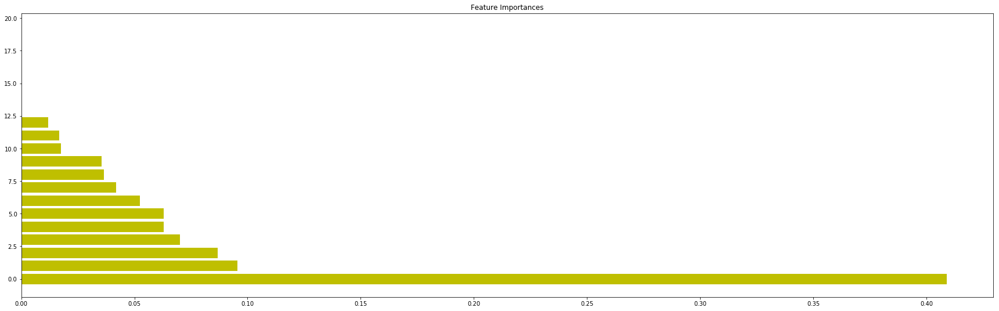

In [271]:
importances = clf.feature_importances_
indices = np.argsort(importances)[::-1]
plt.figure()
plt.title("Feature Importances")
n=20
plt.barh(range(n),importances[indices[:n]],color='y')
plt.yticks(range(n),[train_data.columns[i]for i in indices[:n]])
plt.xlabel('relative Importance')
plt.show()

pd.DataFrame([train_data.columns[indices],np.sort(importances)[::-1]])

In [0]:
train_data.index

RangeIndex(start=0, stop=2568, step=1)

## applying PCA

In [0]:
# x_train[num_attr]=scaler.transform(x_train[num_attr])

In [0]:
num_attr

['positive_score',
 'negative_score',
 'uncertainty_scores',
 'polarity_score',
 'word_count',
 'avg_sen_length',
 'Date',
 'harvard_1']

In [0]:
#min max scaling of the data 

from sklearn.preprocessing import StandardScaler

scaler = StandardScaler() #standardizing the data
scaler.fit(x_train[num_attr])

x_train[num_attr]=scaler.transform(x_train[num_attr])
x_test[num_attr]=scaler.transform(x_test[num_attr])

test_data[num_attr] = scaler.transform(test_data[num_attr])
print(x_train.shape)
print(x_test.shape)
print(test_data.shape)

In [0]:
from sklearn.decomposition import PCA
pca = PCA(n_components = 20)
x_train = pca.fit_transform(x_train)
x_test = pca.transform(x_test)
explained_variance = pca.explained_variance_ratio_

In [0]:
principle_components = pd.DataFrame(x_train)

In [0]:
principle_components.head(5)

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19
0,0.694220,0.469046,0.085879,0.023991,0.078626,0.040830,0.010139,0.194818,-0.031897,-0.085366,-0.139034,0.629947,-0.628709,-0.310922,0.058914,0.027328,-0.059684,0.129248,0.038152,0.004340
1,2.185759,0.153745,0.067691,-0.176551,0.130350,0.064673,0.041421,0.228201,-0.040482,-0.087766,-0.138973,0.635542,-0.632035,-0.324389,0.105865,0.068988,-0.031965,0.182571,0.069774,0.014578
2,0.833049,0.284455,0.205247,0.065997,-0.029192,-0.005861,-0.045829,0.055244,-0.005268,-0.014714,-0.020169,0.095740,0.122105,0.242961,-0.311370,0.844090,-0.111432,0.192525,0.031966,-0.003949
3,0.167412,0.109835,0.053091,-0.079582,0.079925,0.042999,0.015335,0.191244,-0.033522,-0.088261,-0.139850,0.630381,-0.631626,-0.312474,0.066839,0.039039,-0.059445,0.121485,0.027557,0.000951
4,-2.378180,1.849157,-0.171064,-0.333936,-0.100330,-0.043170,-0.019395,-0.074395,0.008409,-0.016848,-0.001330,-0.006259,0.017638,0.041137,-0.062584,-0.051245,-0.024162,-0.069770,-0.082834,-0.007568


In [0]:
print('Explained variation per principal component: {}'.format(pca.explained_variance_ratio_))

Explained variation per principal component: [0.69094596 0.13605906 0.01950397 0.01360883 0.00852581 0.00828068
 0.00789411 0.00779161 0.00760337 0.00751417 0.00746686 0.00734602
 0.00723845 0.00715585 0.00711444 0.00691809 0.0067796  0.0065372
 0.00626894 0.00474796]


In [0]:
ratio = pca.explained_variance_ratio_

In [0]:
ratio.sum()

0.975300988406295

In [0]:
np.sum(pca.explained_variance_ratio_)

0.975300988406295

In [0]:
cum=pca.explained_variance_ratio_.cumsum()
print(pca.explained_variance_ratio_.cumsum())

[0.69094596 0.82700502 0.84650899 0.86011782 0.86864363 0.87692431
 0.88481842 0.89261003 0.9002134  0.90772757 0.91519443 0.92254045
 0.9297789  0.93693475 0.9440492  0.95096729 0.95774688 0.96428409
 0.97055303 0.97530099]


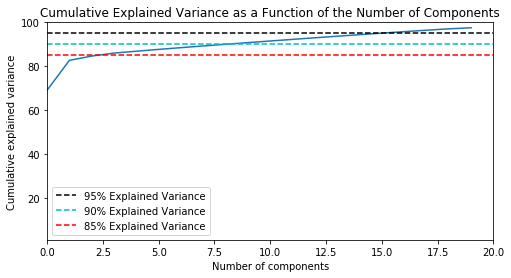

In [0]:
%matplotlib inline
plt.figure(figsize=(8,4))
plt.plot(np.cumsum(pca.explained_variance_ratio_*100))

plt.xlim(xmax=20, xmin= 0)
plt.ylim(ymax = 100, ymin = 1)

plt.title('Cumulative Explained Variance as a Function of the Number of Components')
plt.xlabel('Number of components')
plt.ylabel('Cumulative explained variance');

plt.axhline(y = 95, color='k', linestyle='--', label = '95% Explained Variance')
plt.axhline(y = 90, color='c', linestyle='--', label = '90% Explained Variance')
plt.axhline(y = 85, color='r', linestyle='--', label = '85% Explained Variance')

# PLOT OUT THE EXPLAINED VARIANCES SUPERIMPOSED 
plt.legend(loc='best')
plt.show()


### After doing PCA out of 31 variables 19 variables are explaining 97.5% 

---

